In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.colors as mcolors

In [2]:
df = pd.read_csv('../data/tfl_stations_2022_with_coordinates.csv')
df.head(5)

,Line,Station Name,Latitude,Longitude
0,Bakerloo,Baker Street,51.523155,-0.156863
1,Bakerloo,Charing Cross,51.508137,-0.124762
2,Bakerloo,Edgware Road,51.520291,-0.170194
3,Bakerloo,Elephant & Castle,51.494601,-0.100329
4,Bakerloo,Embankment,51.507255,-0.122194


In [3]:
df.tail(10)

,Line,Station Name,Latitude,Longitude
596,Victoria,Pimlico,51.490744,-0.140362
597,Victoria,Seven Sisters,51.582328,-0.074985
598,Victoria,Stockwell,51.472046,-0.123003
599,Victoria,Tottenham Hale,51.589032,-0.059796
600,Victoria,Vauxhall,51.486098,-0.122774
601,Victoria,Victoria,51.491934,-0.224802
602,Victoria,Walthamstow Central,51.582825,-0.019818
603,Victoria,Warren Street,51.524619,-0.138167
604,Waterloo & City,Bank and Monument,51.511002,-0.086659
605,Waterloo & City,Waterloo,51.503080,-0.115124


In [4]:
edges = pd.read_csv('../data/2022-tfl-edges.csv')
edges.head(10)

,Line,From Station,To Station
0,Bakerloo,Elephant & Castle,Lambeth North
1,Bakerloo,Lambeth North,Waterloo
2,Bakerloo,Waterloo,Embankment
3,Bakerloo,Embankment,Charing Cross
4,Bakerloo,Charing Cross,Piccadilly Circus
5,Bakerloo,Piccadilly Circus,Oxford Circus
6,Bakerloo,Oxford Circus,Regent's Park
7,Bakerloo,Regent's Park,Baker Street
8,Bakerloo,Baker Street,Marylebone
9,Bakerloo,Marylebone,Edgware Road


In [5]:
edges.tail(10)

,Line,From Station,To Station
1177,Victoria,Euston,Warren Street
1178,Victoria,Warren Street,Oxford Circus
1179,Victoria,Oxford Circus,Green Park
1180,Victoria,Green Park,Victoria
1181,Victoria,Victoria,Pimlico
1182,Victoria,Pimlico,Vauxhall
1183,Victoria,Vauxhall,Stockwell
1184,Victoria,Stockwell,Brixton
1185,Waterloo & City,Waterloo,Bank and Monument
1186,Waterloo & City,Bank and Monument,Waterloo


In [6]:
df['Line'].unique()

array(['Bakerloo', 'Central', 'DLR', 'District', 'Elizabeth Line',
       'H&C and Circle', 'Jubilee', 'LO East London',
       'LO Gospel Oak-Barking', 'LO North London', 'LO Romford–Upminster',
       'LO Watford-Euston', 'LO West Anglia', 'London Trams',
       'Metropolitan', 'Northern', 'Piccadilly', 'Victoria',
       'Waterloo & City'], dtype=object)

In [7]:
edges['Line'].unique()

array(['Bakerloo', 'Central', 'District', 'DLR', 'Elizabeth Line',
       'H&C and Circle', 'Jubilee', 'Overground', 'London Trams',
       'Metropolitan', 'Northern', 'Piccadilly', 'Victoria',
       'Waterloo & City'], dtype=object)

In [8]:
def consolidate_overground(df):
    # List of London Overground lines
    lo_lines = ['LO East London', 'LO Gospel Oak-Barking', 'LO North London', 
                'LO Romford–Upminster', 'LO Watford-Euston', 'LO West Anglia']
    
    # Replace all LO lines with 'Overground'
    df['Line'] = df['Line'].replace(lo_lines, 'Overground')
        # Remove duplicates, keeping the first occurrence
    # df.drop_duplicates(subset=['Station Name'], keep='first', inplace=True)

    # Reset the index
    df.reset_index(drop=True, inplace=True)
    
    return df

In [9]:
df = consolidate_overground(df)

In [10]:
df['Line'].unique()

array(['Bakerloo', 'Central', 'DLR', 'District', 'Elizabeth Line',
       'H&C and Circle', 'Jubilee', 'Overground', 'London Trams',
       'Metropolitan', 'Northern', 'Piccadilly', 'Victoria',
       'Waterloo & City'], dtype=object)

In [11]:
def assign_line_colors(df):
    line_colors = {
        'Bakerloo': 'brown',
        'Central': 'red',
        'DLR': 'turquoise',
        'District': 'green',
        'Elizabeth Line': 'purple',
       'H&C and Circle': 'pink',
       'Jubilee': 'gray',
       'Overground': 'orange',
       'London Trams': ' lightgreen',
       'Metropolitan': 'magenta',
       'Northern': 'black',
       'Piccadilly' : 'blue',
       'Victoria' : 'lighblue'
    }

    line_stations = {}

    for line in line_colors:
        # Get stations from df
        stations_from_df = set(df[df['Line'] == line]['Station Name'])
        
        # Get stations from edges
        stations_from_edges = set(edges[edges['Line'] == line]['From Station']).union(
            set(edges[edges['Line'] == line]['To Station']))
        
        # Combine stations from both dataframes
        line_stations[line] = stations_from_df.union(stations_from_edges)
    
    return line_colors, line_stations

def assign_line_colors_and_stations(df, edges):
    # Define line colors
    line_colors = {
        'Bakerloo': 'brown',
        'Central': 'red',
        'DLR': 'turquoise',
        'District': 'green',
        'Elizabeth Line': 'purple',
       'H&C and Circle': 'pink',
       'Jubilee': 'gray',
       'Overground': 'orange',
       'London Trams': 'lightgreen',
       'Metropolitan': 'magenta',
       'Northern': 'black',
       'Piccadilly' : 'blue',
       'Victoria' : 'lightblue',
        'Waterloo & City': 'blue'

    }
    
    # Gather stations for each line
    line_stations = {}
    for line in line_colors:
        # Get stations from df
        stations_from_df = set(df[df['Line'] == line]['Station Name'])
        
        # Get stations from edges
        stations_from_edges = set(edges[edges['Line'] == line]['From Station']).union(
            set(edges[edges['Line'] == line]['To Station']))
        
        # Combine stations from both dataframes
        line_stations[line] = stations_from_df.union(stations_from_edges)
    
    return line_colors, line_stations

In [12]:
line_colors, line_stations = assign_line_colors_and_stations(df, edges)

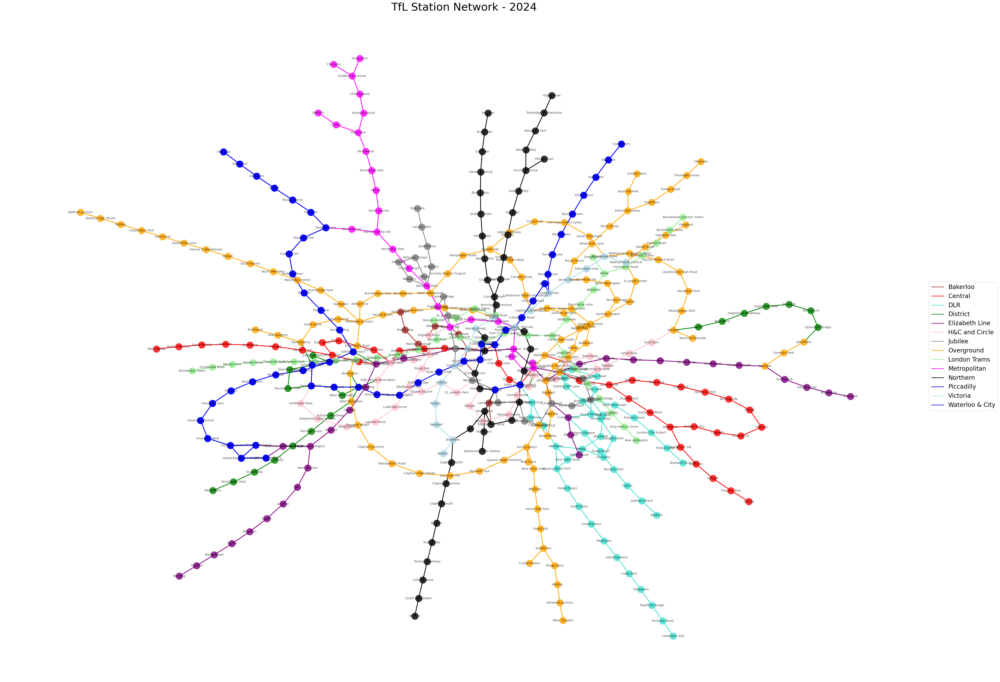

In [13]:
def plot_tfl_network(df, edges):
    # Create a graph
    G = nx.Graph()

    # Assign colors and gather stations
    line_colors, line_stations = assign_line_colors_and_stations(df, edges)

    # Add nodes and edges
    for line, stations in line_stations.items():
        color = line_colors[line]
        for station in stations:
            G.add_node(station, color=color)

    for _, row in edges.iterrows():
        G.add_edge(row['From Station'], row['To Station'], color=line_colors[row['Line']])

    # Use Kamada-Kawai layout
    pos = nx.kamada_kawai_layout(G)

    # Flip the layout horizontally and vertically
    flipped_pos = {node: (-x, -y) for node, (x, y) in pos.items()}

    # Create the plot
    plt.figure(figsize=(55, 40))
    
    # Draw nodes
    for line, color in line_colors.items():
        node_list = [node for node in G.nodes() if G.nodes[node]['color'] == color]
        nx.draw_networkx_nodes(G, flipped_pos, nodelist=node_list, node_color=color, 
                               node_size=500, alpha=0.8)

    # Draw edges
    for line, color in line_colors.items():
        edge_list = [(u, v) for (u, v, d) in G.edges(data=True) if d['color'] == color]
        nx.draw_networkx_edges(G, flipped_pos, edgelist=edge_list, edge_color=color, width=2.5)

    # Draw labels
    nx.draw_networkx_labels(G, flipped_pos, font_size=10, font_color='black', alpha=0.7)

    # Remove axis
    plt.axis('off')

    # Add title
    plt.title('TfL Station Network - 2024', fontsize=36)

    # Add a legend
    for line, color in line_colors.items():
        plt.plot([], [], color=color, label=line, linewidth=2)
    plt.legend(fontsize=20, loc='center left', bbox_to_anchor=(1, 0.5))

    plt.show()

# Assuming df and edges are your dataframes
plot_tfl_network(df, edges)

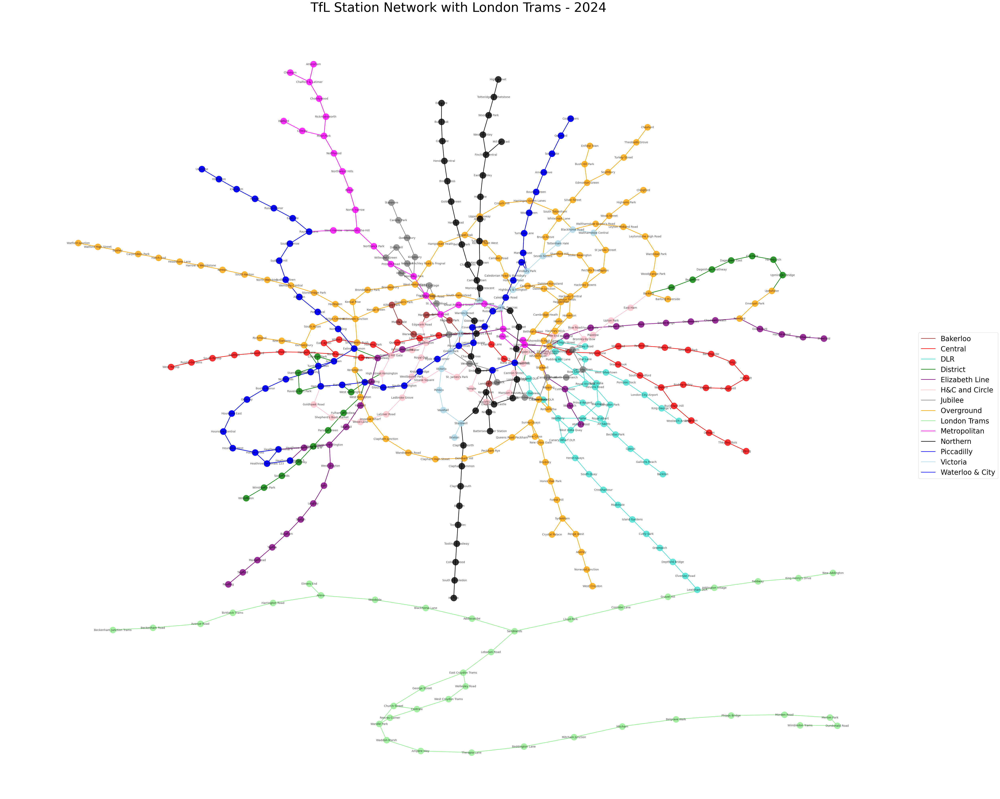

In [14]:
def plot_tfl_network(df, edges):
    # Create two graphs: one for the main network and one for London Trams
    G_main = nx.Graph()
    G_tram = nx.Graph()

    # Assign colors and gather stations
    line_colors, line_stations = assign_line_colors_and_stations(df, edges)

    # Add nodes and edges to the appropriate graph
    for line, stations in line_stations.items():
        color = line_colors[line]
        for station in stations:
            if line == 'London Trams':
                G_tram.add_node(station, color=color)
            else:
                G_main.add_node(station, color=color)

    for _, row in edges.iterrows():
        if row['Line'] == 'London Trams':
            G_tram.add_edge(row['From Station'], row['To Station'], color=line_colors[row['Line']])
        else:
            G_main.add_edge(row['From Station'], row['To Station'], color=line_colors[row['Line']])

    # Use Kamada-Kawai layout for main network
    pos_main = nx.kamada_kawai_layout(G_main)
    
    # Use spring layout for tram network (it's usually simpler)
    pos_tram = nx.spring_layout(G_tram)

    # Flip the main layout horizontally and vertically
    flipped_pos_main = {node: (-x, -y) for node, (x, y) in pos_main.items()}

    # Adjust tram positions to be at the bottom
    min_y_main = min(y for x, y in flipped_pos_main.values())
    max_x_tram = max(x for x, y in pos_tram.values())
    min_x_tram = min(x for x, y in pos_tram.values())
    tram_width = max_x_tram - min_x_tram
    tram_center = (max_x_tram + min_x_tram) / 2

    adjusted_pos_tram = {node: (x - tram_center, y / 3 + min_y_main - 0.2) for node, (x, y) in pos_tram.items()}

    # Create the plot
    plt.figure(figsize=(50, 40))  # Increased height to accommodate tram line
    
    # Function to draw nodes and edges
    def draw_network(G, pos, ax):
        for line, color in line_colors.items():
            node_list = [node for node in G.nodes() if G.nodes[node]['color'] == color]
            nx.draw_networkx_nodes(G, pos, nodelist=node_list, node_color=color, 
                                   node_size=500, alpha=0.8, ax=ax)
        
        for line, color in line_colors.items():
            edge_list = [(u, v) for (u, v, d) in G.edges(data=True) if d['color'] == color]
            nx.draw_networkx_edges(G, pos, edgelist=edge_list, edge_color=color, width=2, ax=ax)
        
        nx.draw_networkx_labels(G, pos, font_size=10, font_color='black', ax=ax, alpha=0.7)

    # Draw main network
    draw_network(G_main, flipped_pos_main, plt.gca())

    # Draw tram network
    draw_network(G_tram, adjusted_pos_tram, plt.gca())

    # Remove axis
    plt.axis('off')

    # Add title
    plt.title('TfL Station Network with London Trams - 2024', fontsize=46)

    # Add a legend
    for line, color in line_colors.items():
        plt.plot([], [], color=color, label=line, linewidth=2)
    plt.legend(fontsize=25, loc='center left', bbox_to_anchor=(1, 0.5))

    plt.tight_layout()
    plt.show()

# Assuming df and edges are your dataframes
plot_tfl_network(df, edges)

### Calculating Centrality of 2024 Network

In [15]:
def calculate_centrality(G, measure):
    if measure == 'degree':
        return nx.degree_centrality(G)
    elif measure == 'betweenness':
        return nx.betweenness_centrality(G)
    elif measure == 'closeness':
        return nx.closeness_centrality(G)
    elif measure == 'katz':
        return nx.katz_centrality(G, alpha=0.1, beta=1.0, max_iter=1000)
    elif measure == 'pagerank':
        return nx.pagerank(G)

def get_top_nodes(centrality_dict, n=5):
    return sorted(centrality_dict, key=centrality_dict.get, reverse=True)[:n]

In [16]:
def plot_centrality(G, df, edges, centrality_measure):
    line_colors, line_stations = assign_line_colors_and_stations(df, edges)
    
    try:
        centrality = calculate_centrality(G, centrality_measure)
        if not centrality:  # If centrality calculation failed and returned an empty dict
            print(f"Skipping plot for {centrality_measure} centrality due to calculation failure.")
            return [], {}


        top_nodes = get_top_nodes(centrality)
    
        pos = nx.kamada_kawai_layout(G)
        flipped_pos = {node: (-x, -y) for node, (x, y) in pos.items()}
    
        plt.figure(figsize=(55, 40))
    
        # Draw regular nodes
        nx.draw_networkx_nodes(G, flipped_pos, node_size=400, node_color='lightgray')
        nx.draw_networkx_edges(G, flipped_pos, width=1, alpha=0.5)
    
        # Draw top nodes
        nx.draw_networkx_nodes(G, flipped_pos, nodelist=top_nodes, node_size=800, 
                               node_color='red', alpha=0.8)
    
        # Draw edges from top nodes
        for node in top_nodes:
            nx.draw_networkx_edges(G, flipped_pos, edgelist=G.edges(node), width=2, 
                                   alpha=0.8, edge_color='red')
    
        # Labels
        labels = nx.draw_networkx_labels(G, flipped_pos, font_size=8, alpha=0.8)
        for node in top_nodes:
            labels[node].set_fontweight('bold')
    
        plt.title(f'{centrality_measure.capitalize()} Centrality', fontsize=36)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    
        return top_nodes, centrality
    except Exception as e:
        print(f"Error calculating {centrality_measure} centrality: {str(e)}")
        return [], {}

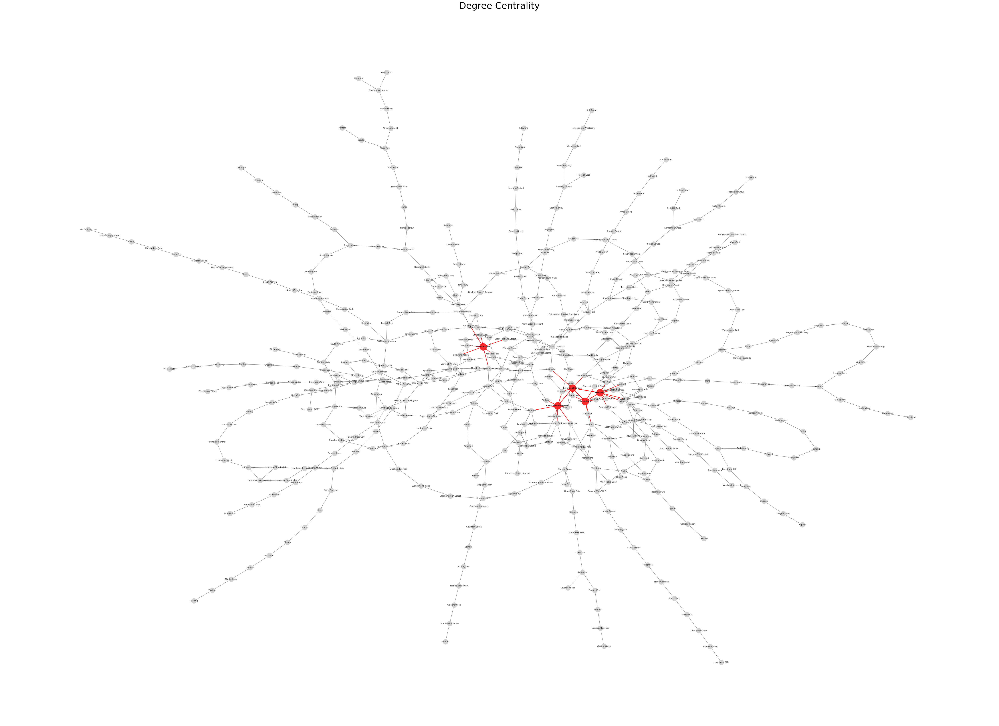

Top 5 degree centrality nodes: ['Stratford', 'Liverpool Street', 'Bank and Monument', 'Baker Street', 'Whitechapel']


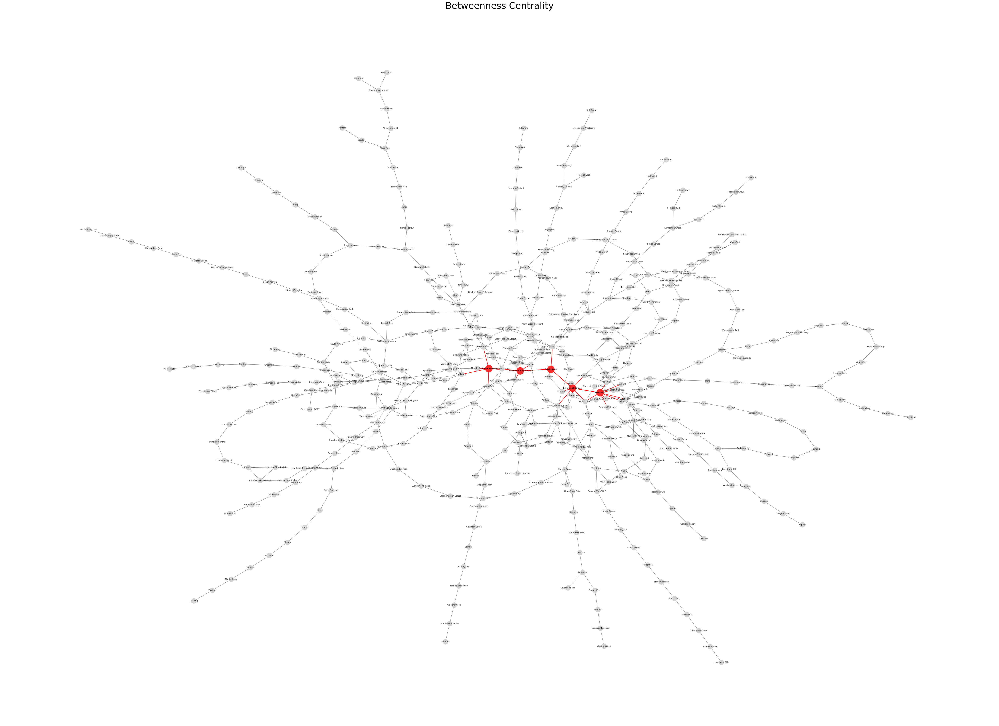

Top 5 betweenness centrality nodes: ['Liverpool Street', 'Farringdon', 'Bond Street', 'Stratford', 'Tottenham Court Road']


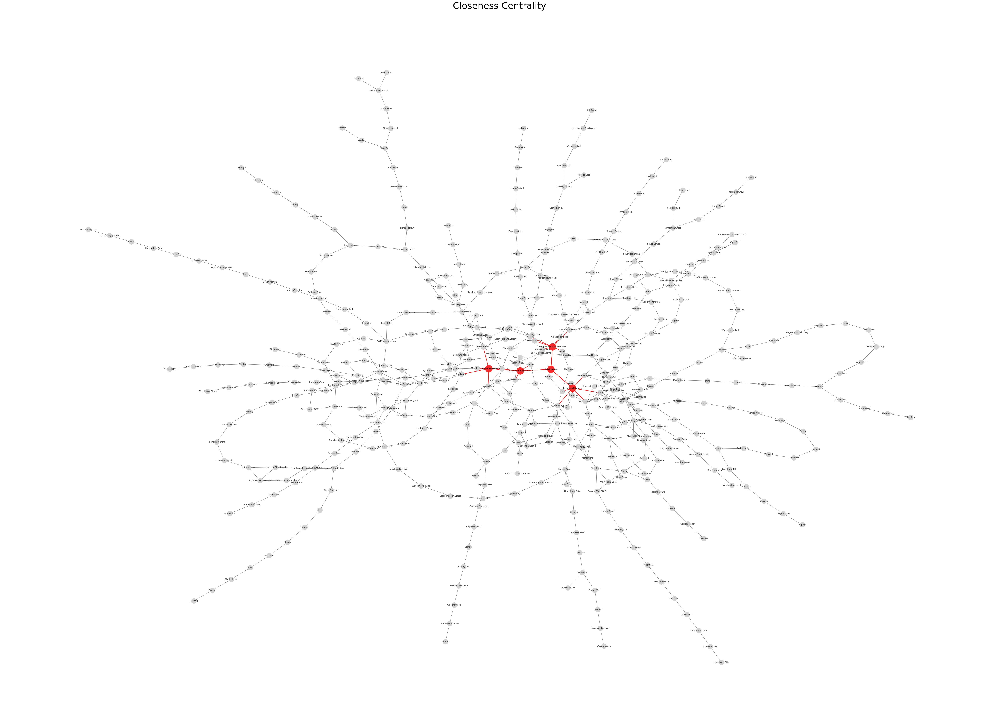

Top 5 closeness centrality nodes: ['Farringdon', 'Liverpool Street', 'Tottenham Court Road', 'Bond Street', "King's Cross St. Pancras"]


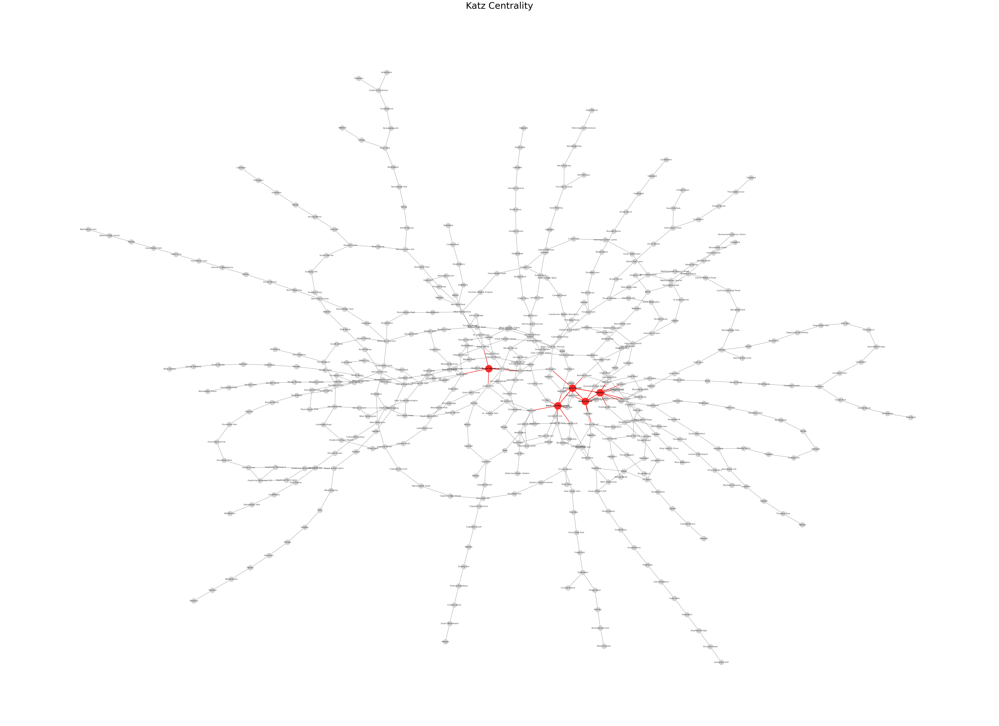

Top 5 katz centrality nodes: ['Stratford', 'Liverpool Street', 'Bank and Monument', 'Whitechapel', 'Bond Street']


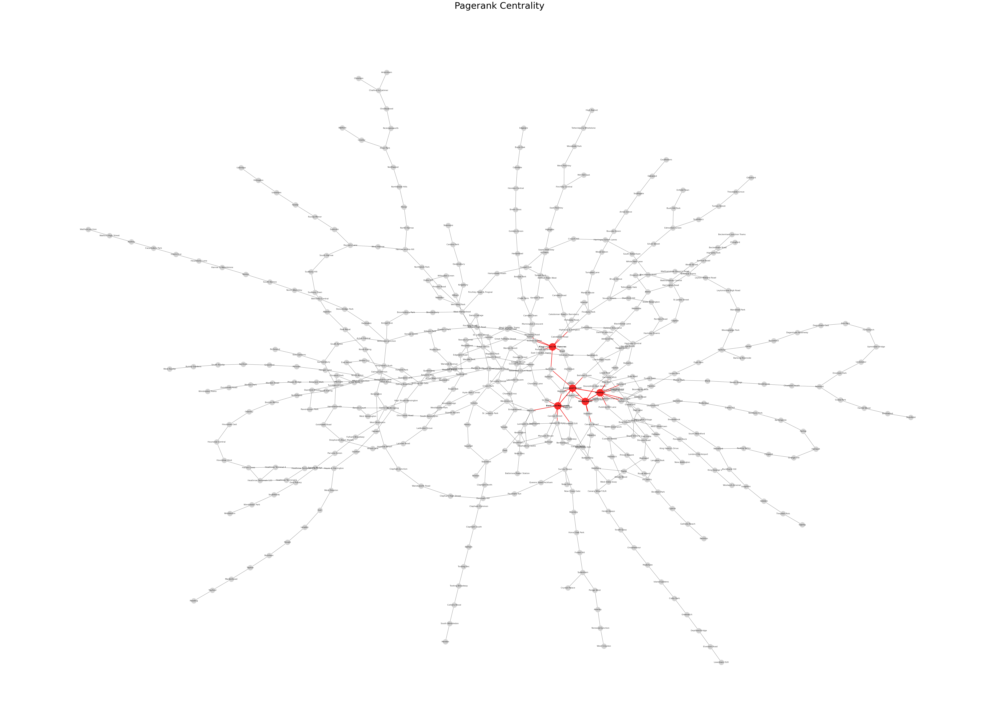

Top 5 pagerank centrality nodes: ['Stratford', 'Bank and Monument', 'Liverpool Street', "King's Cross St. Pancras", 'Whitechapel']
Overall top 5 central nodes: ['Liverpool Street', 'Stratford', 'Bank and Monument', 'Farringdon', 'Bond Street']


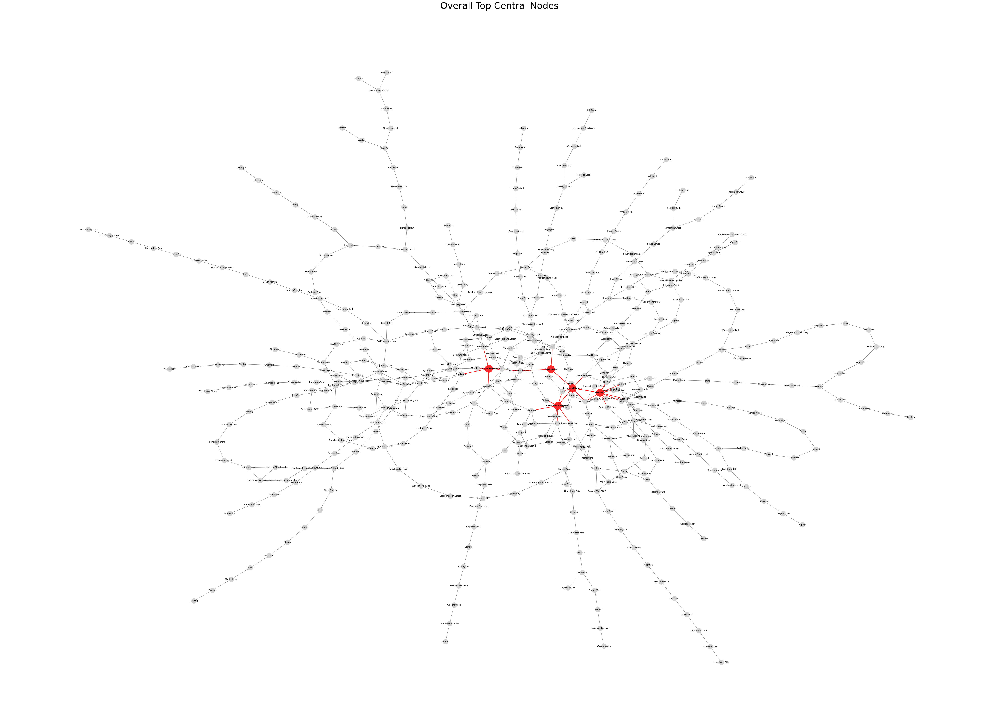

In [19]:
def combine_top_nodes(centrality_results):
    all_top_nodes = set()
    node_scores = {}
    
    for measure, (top_nodes, centrality) in centrality_results.items():
        all_top_nodes.update(top_nodes)
        for node in all_top_nodes:
            if node not in node_scores:
                node_scores[node] = 0
            if node in top_nodes:
                node_scores[node] += 5 - top_nodes.index(node)  # 5 points for 1st, 4 for 2nd, etc.
            node_scores[node] += centrality.get(node, 0)  # Add centrality value
    
    overall_top_nodes = sorted(node_scores, key=node_scores.get, reverse=True)[:5]
    return overall_top_nodes

def plot_tfl_network(df, edges):
    # G = nx.Graph()
    
    line_colors, line_stations = assign_line_colors_and_stations(df, edges)
    
    for line, stations in line_stations.items():
        for station in stations:
            G.add_node(station, color=line_colors[line])
    
    for _, row in edges.iterrows():
        G.add_edge(row['From Station'], row['To Station'], color=line_colors[row['Line']])
    
    centrality_measures = ['degree', 'betweenness', 'closeness', 'katz', 'pagerank']
    centrality_results = {}
    
    for measure in centrality_measures:
        top_nodes, centrality = plot_centrality(G, df, edges, measure)
        if centrality:  # Only add to results if calculation was successful
            centrality_results[measure] = (top_nodes, centrality)
            print(f"Top 5 {measure} centrality nodes:", top_nodes)
    
    if centrality_results:
        overall_top_nodes = combine_top_nodes(centrality_results)
        print("Overall top 5 central nodes:", overall_top_nodes)
        
        # Plot overall top nodes
        pos = nx.kamada_kawai_layout(G)
        flipped_pos = {node: (-x, -y) for node, (x, y) in pos.items()}
        
        plt.figure(figsize=(55, 40))
        
        nx.draw_networkx_nodes(G, flipped_pos, node_size=400, node_color='lightgray')
        nx.draw_networkx_edges(G, flipped_pos, width=1, alpha=0.5)
        
        nx.draw_networkx_nodes(G, flipped_pos, nodelist=overall_top_nodes, node_size=900, 
                               node_color='red', alpha=0.8)
        
        for node in overall_top_nodes:
            nx.draw_networkx_edges(G, flipped_pos, edgelist=G.edges(node), width=2, 
                                   alpha=0.8, edge_color='red')
        
        labels = nx.draw_networkx_labels(G, flipped_pos, font_size=8)
        for node in overall_top_nodes:
            labels[node].set_fontweight('bold')
        
        plt.title('Overall Top Central Nodes', fontsize=36)
        plt.axis('off')
        plt.tight_layout()
        plt.show()
    else:
        print("No centrality measures could be calculated successfully.")
G = nx.Graph()
# Assuming df and edges are your dataframes
plot_tfl_network(df, edges)

In [20]:
def get_top_centrality_nodes(G, centrality_measures):
    def get_top_nodes(centrality_dict, n=5):
        return sorted(centrality_dict.items(), key=lambda x: x[1], reverse=True)[:n]

    top_nodes_lists = {}
    for measure in centrality_measures:
        centrality = calculate_centrality(G, measure)
        top_nodes = get_top_nodes(centrality)
        top_nodes_lists[measure] = top_nodes

    def combine_top_nodes(top_nodes_lists):
        all_nodes = {}
        for measure, nodes in top_nodes_lists.items():
            for i, (node, score) in enumerate(nodes):
                if node not in all_nodes:
                    all_nodes[node] = {'total_score': 0, 'appearances': 0}
                all_nodes[node]['total_score'] += (5 - i)  # 5 points for 1st, 4 for 2nd, etc.
                all_nodes[node]['appearances'] += 1
        
        # Calculate a combined score: total_score * (appearances / 5)
        for node in all_nodes:
            all_nodes[node]['combined_score'] = all_nodes[node]['total_score'] * (all_nodes[node]['appearances'] / 5)
        
        # Sort by combined score and return top 5
        return sorted(all_nodes.items(), key=lambda x: x[1]['combined_score'], reverse=True)[:5]

    overall_top_nodes = combine_top_nodes(top_nodes_lists)

    # Prepare the result
    result = {
        'top_nodes_by_measure': {measure: [node for node, _ in nodes] for measure, nodes in top_nodes_lists.items()},
        'overall_top_nodes': overall_top_nodes
    }

    return result

# Example usage:
centrality_measures = ['degree', 'betweenness', 'closeness', 'pagerank', 'katz']
top_centrality_nodes = get_top_centrality_nodes(G, centrality_measures)

# Print results
for measure, nodes in top_centrality_nodes['top_nodes_by_measure'].items():
    print(f"Top 5 {measure} centrality nodes: {nodes}")

print("\nTop 5 nodes across all centrality measures:")
for i, (node, data) in enumerate(top_centrality_nodes['overall_top_nodes'], 1):
    print(f"{i}. {node} - Combined Score: {data['combined_score']:.2f}, Appearances: {data['appearances']}")

Top 5 degree centrality nodes: ['Stratford', 'Liverpool Street', 'Bank and Monument', 'Baker Street', 'Whitechapel']
Top 5 betweenness centrality nodes: ['Liverpool Street', 'Farringdon', 'Bond Street', 'Stratford', 'Tottenham Court Road']
Top 5 closeness centrality nodes: ['Farringdon', 'Liverpool Street', 'Tottenham Court Road', 'Bond Street', "King's Cross St. Pancras"]
Top 5 pagerank centrality nodes: ['Stratford', 'Bank and Monument', 'Liverpool Street', "King's Cross St. Pancras", 'Whitechapel']
Top 5 katz centrality nodes: ['Stratford', 'Liverpool Street', 'Bank and Monument', 'Whitechapel', 'Bond Street']

Top 5 nodes across all centrality measures:
1. Liverpool Street - Combined Score: 20.00, Appearances: 5
2. Stratford - Combined Score: 13.60, Appearances: 4
3. Bank and Monument - Combined Score: 6.00, Appearances: 3
4. Farringdon - Combined Score: 3.60, Appearances: 2
5. Bond Street - Combined Score: 3.60, Appearances: 3
